<a href="https://colab.research.google.com/github/jesusmlb/computer_vision_car_odometer/blob/main/Computer_vision_pj.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem Statement
## Build a Proof of Concep: Build a system to detect only the distance reading from mobile camera shots of car dashboard

**Strategy**
1. Build and/or tune an object-detection algorithm to locate rectangular display, containg the relevant data, in the camera-captured images.
2. Build and/or tune an algorithm to detect and extract text from the bounding box area with a high accuracy and confidence.
3. Present observations about the dataset and a working moddel to client.

**Steps**
1. Tune a pre-trained YOLOv8 Object detection network to locate the bbox with the relevant information.
2. Preprocess images to extract distance information and evaluate with actual readings.
3. Experiment and iterate through step 2 as required, and to improve confidence level in the reading.
4. Quarantine images with with poor OCR readings or readings with low-confidence levels in the distance reading and analyze the image attributes. Compare with good readings.
4. Present findings to client on
>- Quality of images required for a viable prototype.
>- Atrributes of the quarantined images.

In [ ]:
!pip install ultralytics

In [30]:
%%capture
!pip install easyocr

In [31]:
# Libraries to use
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import numpy as np
from PIL import Image
import easyocr

In [3]:
# Our model that was already pretrained and saved the best weightes for this project
#results = model.train(data=os.path.join(ROOT_DIR,"config.yaml"),epochs=100) #os.path.join(ROOT_DIR,"config.yaml")

# Best model
model = YOLO('/content/drive/MyDrive/CV_pj/weights/best3.pt')

In [4]:
# Let's try to test our model with a simple image to classify
im1_path = '/content/drive/MyDrive/CV_pj/img/169633.jpg'
results = model.predict(im1_path)
result = results[0]
print(len(result.boxes))


image 1/1 /content/drive/MyDrive/CV_pj/img/169633.jpg: 480x640 1 mileage, 328.1ms
Speed: 22.0ms preprocess, 328.1ms inference, 34.2ms postprocess per image at shape (1, 3, 480, 640)
1


In [5]:
# Creating the bounderies box for the milage that we need to recognize
for box in result.boxes:
  label = result.names[box.cls[0].item()]
  cords = [round(x) for x in box.xyxy[0].tolist()] # Coordinates of our Bounderies box
  prob = box.conf[0].item() # Confidence of the model
  print("Object type:", label)
  print("Coordinates:", cords)
  print("Probability:", prob)

Object type: mileage
Coordinates: [2368, 1894, 2941, 2090]
Probability: 0.8858163356781006


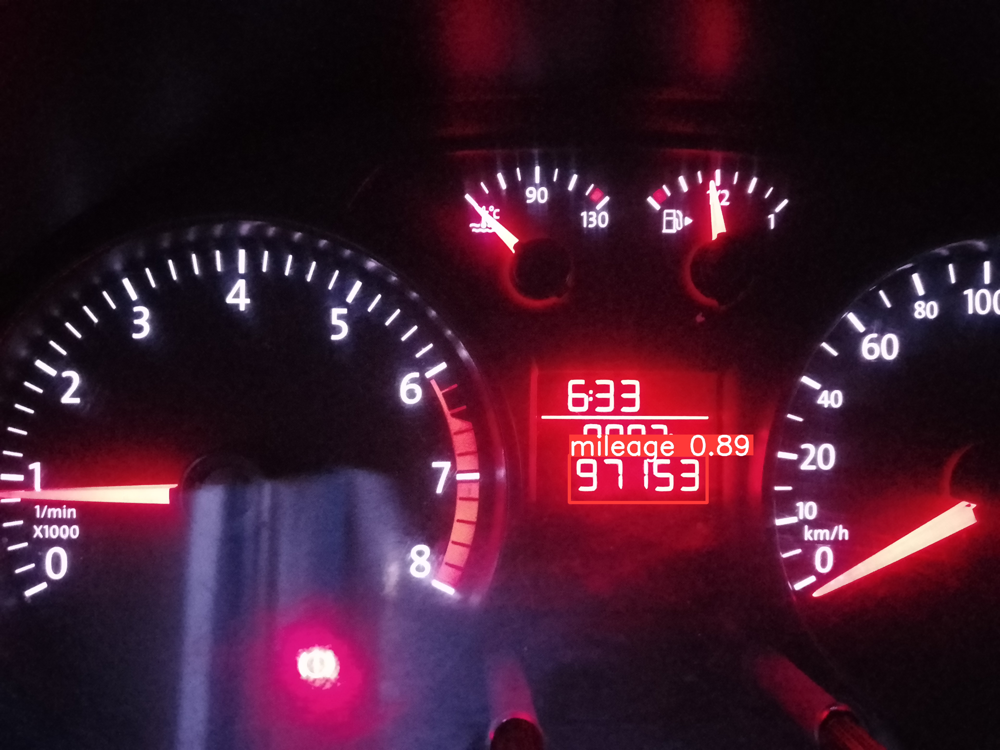

In [7]:
# Now let's draw the Bbox in the image
Image.fromarray(result.plot()[:,:,::-1])

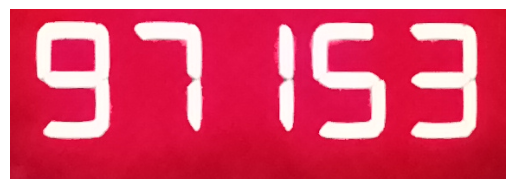

In [35]:
# Open the image
image = Image.open(im1_path)
img_cropped = image.crop(cords)
# Save the cropped image in the Colab directory
output_path = "/content/cropped_image.jpg"
img_cropped.save(output_path)
# Let's plot our cropped image
plt.imshow(image.crop(cords))
plt.axis('off')  # Hide axis labels
plt.show()

In [32]:
# Initialize the EasyOCR reader to recognize the digist
reader = easyocr.Reader(['en'])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [39]:
# Let's save the image in our variable
img_c = '/content/cropped_image.jpg'

In [37]:
def ocr_filter(img):
  """
    This function will handle the yellow odometers, those one where the numbers are too thin to recognize with OCR
    just have to input the path of the image
  """
  # Read the image
  image = cv2.imread(img)

  # Convert to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Apply Gaussian blur
  blurred = cv2.GaussianBlur(gray, (9, 9), 0)

  # Define a kernel for morphological operations
  kernel = np.ones((5, 5), np.uint8)

  # Apply MORPH_CLOSE operation
  closed = cv2.morphologyEx(blurred, cv2.MORPH_CLOSE, kernel)

  # Define a kernel for morphological operations
  kernel = np.ones((4, 4), np.uint8)

  # Apply Erode operation
  erode = cv2.erode(closed, kernel, iterations=1)

  # Define a kernel for morphological operations
  kernel_sharpening = np.array([[-1,-1,-1],
                                [-1,9,-1],
                                [-1,-1,-1]])

  # Apply Erosion operation
  erosion = cv2.filter2D(erode, -1, kernel_sharpening)

  text = reader.readtext(erosion)

  # Return the "array"
  return plt.imshow(image), text

(<matplotlib.image.AxesImage at 0x7f7b6e29a4a0>,
 [([[15, 1], [557, 1], [557, 165], [15, 165]], '97153', 0.5145993560672855)])

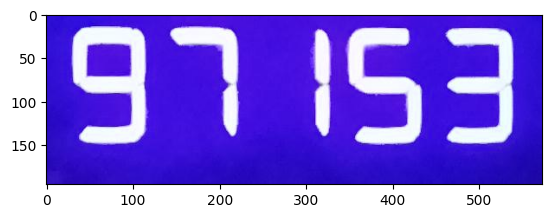

In [38]:
# Let's try to recognise the digist inside the cropped image
ocr_filter(img_c)